<center><h1>Shah_Unnati_HW5</h1></center>
<br>
<br>

Name: Unnati Bhaven Shah
<br>
Github Username: unnatibshah
<br>
USC ID: 4512915005

## 1. Decision Trees as Interpretable Models

Import packages

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pprint
import statsmodels.api as sm
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, export_text, plot_tree
from sklearn.model_selection import GridSearchCV, train_test_split, KFold, cross_val_score
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error, r2_score, confusion_matrix, roc_curve, auc, accuracy_score, classification_report
from sklearn.linear_model import RidgeCV, Ridge, LassoCV, Lasso, LinearRegression
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.neighbors import KNeighborsRegressor
import xgboost as xgb
from skmultilearn.problem_transform import LabelPowerset
import warnings
from sklearn.tree import _tree

warnings.filterwarnings('ignore')

### (a) Obtain Data

Get the Accute Inamations Data Set

In [2]:
INFLAMMATION_DATA = '../data/diagnosis.data'
column_names = ["a1", "a2", "a3", "a4", "a5", "a6", "d1", "d2"]
df = pd.read_csv(INFLAMMATION_DATA, sep='\s+', encoding='UTF_16', header=None, decimal=',', names=column_names)
df

,a1,a2,a3,a4,a5,a6,d1,d2
0,35.5,no,yes,no,no,no,no,no
1,35.9,no,no,yes,yes,yes,yes,no
2,35.9,no,yes,no,no,no,no,no
3,36.0,no,no,yes,yes,yes,yes,no
4,36.0,no,yes,no,no,no,no,no
...,...,...,...,...,...,...,...,...
115,41.4,no,yes,yes,no,yes,no,yes
116,41.5,no,no,no,no,no,no,no
117,41.5,yes,yes,no,yes,no,no,yes
118,41.5,no,yes,yes,no,yes,no,yes


### (b) Build a decision tree

In [3]:
class DecisionTreeAnalysis:
    def __init__(self, df):
        self.df = df

    def transform_to_numeric(self):
        self.df = self.df.replace({'no': 0, 'yes': 1})
        return self.df 
    
    def split_data_X_Y(self):
        dataX = self.df.iloc[:, :-2]
        dataY1 = self.df['d1'].astype(int).to_frame()
        dataY2 = self.df['d2'].astype(int).to_frame()
        return dataX, dataY1, dataY2

    def analyze_decision_tree(self, dataX, dataY):
        classifier = DecisionTreeClassifier(random_state=50)
        model = classifier.fit(dataX, dataY)

        feature_names = dataX.columns.tolist()
        tree_text = export_text(classifier, feature_names=feature_names)
        print("##### Decision Tree: Text Representation #####")
        print(tree_text)

        print("##### Decision Tree: Plot #####")
        plt.figure(figsize=(12, 6))
        plot_tree(classifier, filled=True, feature_names=feature_names, class_names=["No", "Yes"])
        plt.show()

        return classifier

dt_analysis = DecisionTreeAnalysis(df)

In [4]:
df = dt_analysis.transform_to_numeric()
df

,a1,a2,a3,a4,a5,a6,d1,d2
0,35.5,0,1,0,0,0,0,0
1,35.9,0,0,1,1,1,1,0
2,35.9,0,1,0,0,0,0,0
3,36.0,0,0,1,1,1,1,0
4,36.0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...
115,41.4,0,1,1,0,1,0,1
116,41.5,0,0,0,0,0,0,0
117,41.5,1,1,0,1,0,0,1
118,41.5,0,1,1,0,1,0,1


In [5]:
dataX, dataY1, dataY2 = dt_analysis.split_data_X_Y()
print("Shape for trainX: ", dataX.shape)
print("Shape for trainY1: ", dataY1.shape)
print("Shape for trainY2: ", dataY2.shape)

Shape for trainX:  (120, 6)
Shape for trainY1:  (120, 1)
Shape for trainY2:  (120, 1)


##### Decision Tree: Text Representation #####
|--- a4 <= 0.50
|   |--- class: 0
|--- a4 >  0.50
|   |--- a5 <= 0.50
|   |   |--- a1 <= 37.95
|   |   |   |--- class: 1
|   |   |--- a1 >  37.95
|   |   |   |--- class: 0
|   |--- a5 >  0.50
|   |   |--- class: 1

##### Decision Tree: Plot #####


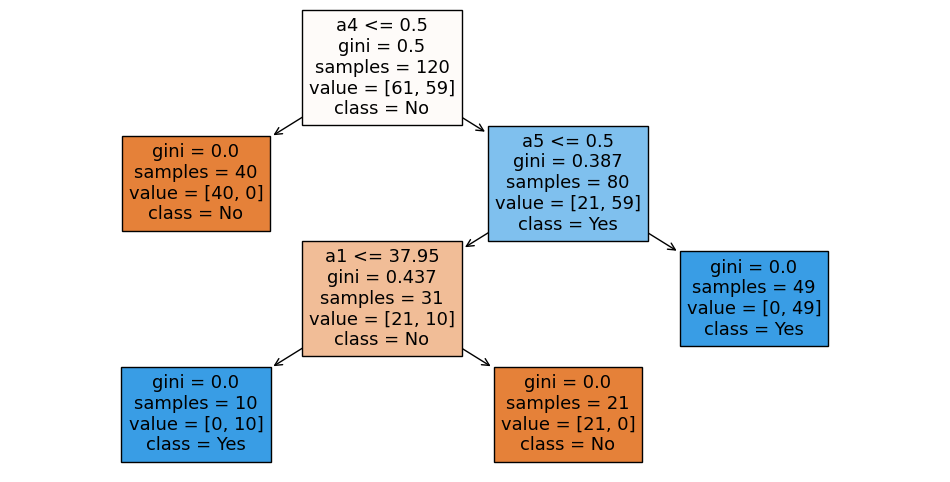

DecisionTreeClassifier(random_state=50)

In [6]:
dt_analysis.analyze_decision_tree(dataX, dataY1)

##### Decision Tree: Text Representation #####
|--- a1 <= 37.95
|   |--- class: 0
|--- a1 >  37.95
|   |--- a3 <= 0.50
|   |   |--- class: 0
|   |--- a3 >  0.50
|   |   |--- class: 1

##### Decision Tree: Plot #####


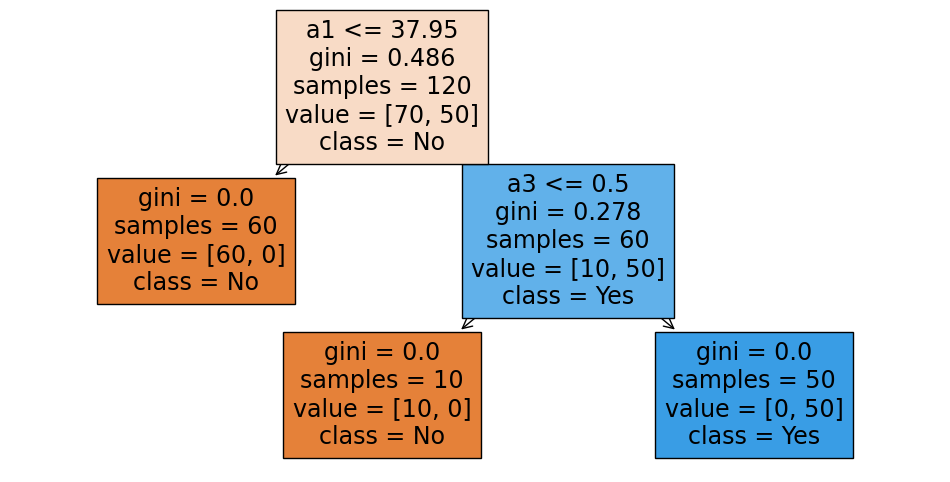

DecisionTreeClassifier(random_state=50)

In [7]:
dt_analysis.analyze_decision_tree(dataX, dataY2)

##### Decision Tree: Text Representation #####
|--- a1 <= 37.95
|   |--- a4 <= 0.50
|   |   |--- class: 0
|   |--- a4 >  0.50
|   |   |--- class: 1
|--- a1 >  37.95
|   |--- a3 <= 0.50
|   |   |--- class: 0
|   |--- a3 >  0.50
|   |   |--- a5 <= 0.50
|   |   |   |--- class: 0
|   |   |--- a5 >  0.50
|   |   |   |--- a4 <= 0.50
|   |   |   |   |--- class: 0
|   |   |   |--- a4 >  0.50
|   |   |   |   |--- class: 0

##### Decision Tree: Plot #####


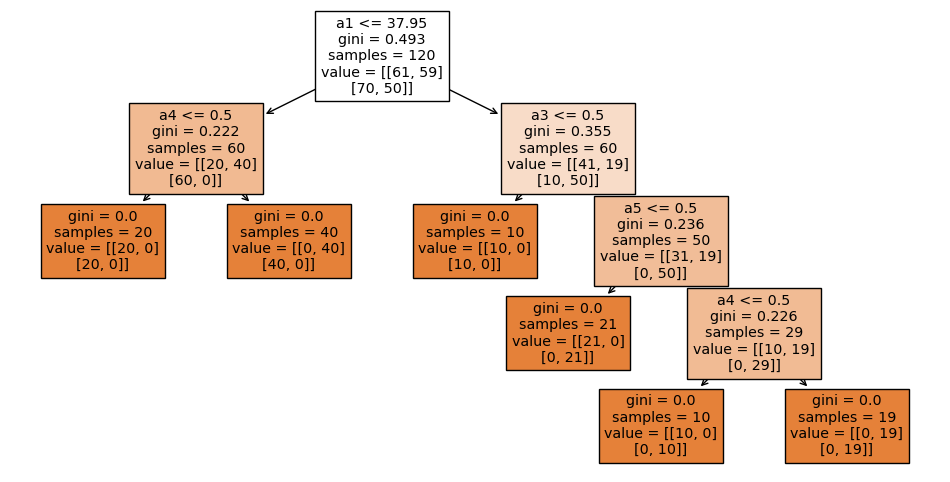

In [8]:
dataX = df.iloc[:, 0:6]
dataY = df.iloc[:, 6:]
dataY = dataY.astype('int')
classifier = dt_analysis.analyze_decision_tree(dataX, dataY)

### (c) Convert the decision rules

In [9]:
class DecisionTreeCodeGenerator:
    def __init__(self, tree, feature_names):
        self.tree_ = tree.tree_
        self.feature_names = feature_names

    def generate_code(self):
        self._generate_code(0, 1)

    def _generate_code(self, node, depth):
        tree_ = self.tree_
        feature_name = [self.feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!" for i in tree_.feature]
        indent = "  " * depth

        print(f"def tree({', '.join(self.feature_names)}):")

        def recurse(node, depth):
            indent = "  " * depth
            if tree_.feature[node] != _tree.TREE_UNDEFINED:
                name = feature_name[node]
                threshold = tree_.threshold[node]
                print(f"{indent}if {name} <= {threshold}:")
                recurse(tree_.children_left[node], depth + 1)
                print(f"{indent}else:  # if {name} > {threshold}")
                recurse(tree_.children_right[node], depth + 1)
            else:
                print(f"{indent}return {tree_.value[node]}")

        recurse(node, depth)

In [10]:
tree_code_generator = DecisionTreeCodeGenerator(classifier, df.columns[0:6])
tree_code_generator.generate_code()

def tree(a1, a2, a3, a4, a5, a6):
  if a1 <= 37.95000076293945:
    if a4 <= 0.5:
      return [[20.  0.]
 [20.  0.]]
    else:  # if a4 > 0.5
      return [[ 0. 40.]
 [40.  0.]]
  else:  # if a1 > 37.95000076293945
    if a3 <= 0.5:
      return [[10.  0.]
 [10.  0.]]
    else:  # if a3 > 0.5
      if a5 <= 0.5:
        return [[21.  0.]
 [ 0. 21.]]
      else:  # if a5 > 0.5
        if a4 <= 0.5:
          return [[10.  0.]
 [ 0. 10.]]
        else:  # if a4 > 0.5
          return [[ 0. 19.]
 [ 0. 19.]]


### (d) Use cost-complexity pruning to find a minimal decision tree and a set of decision rules with high interpretability.

Train Accuracy = 1.0
Test Accuracy = 1.0


[Text(0.4, 0.9, 'x[0] <= 37.95\ngini = 0.493\nsamples = 96\nvalue = [[50, 46]\n[56, 40]]'),
 Text(0.2, 0.7, 'x[3] <= 0.5\ngini = 0.215\nsamples = 48\nvalue = [[15, 33]\n[48, 0]]'),
 Text(0.1, 0.5, 'gini = 0.0\nsamples = 15\nvalue = [[15, 0]\n[15, 0]]'),
 Text(0.3, 0.5, 'gini = 0.0\nsamples = 33\nvalue = [[0, 33]\n[33, 0]]'),
 Text(0.6, 0.7, 'x[2] <= 0.5\ngini = 0.336\nsamples = 48\nvalue = [[35, 13]\n[8, 40]]'),
 Text(0.5, 0.5, 'gini = 0.0\nsamples = 8\nvalue = [[8, 0]\n[8, 0]]'),
 Text(0.7, 0.5, 'x[4] <= 0.5\ngini = 0.219\nsamples = 40\nvalue = [[27, 13]\n[0, 40]]'),
 Text(0.6, 0.3, 'gini = 0.0\nsamples = 17\nvalue = [[17, 0]\n[0, 17]]'),
 Text(0.8, 0.3, 'x[3] <= 0.5\ngini = 0.246\nsamples = 23\nvalue = [[10, 13]\n[0, 23]]'),
 Text(0.7, 0.1, 'gini = 0.0\nsamples = 10\nvalue = [[10, 0]\n[0, 10]]'),
 Text(0.9, 0.1, 'gini = 0.0\nsamples = 13\nvalue = [[0, 13]\n[0, 13]]')]

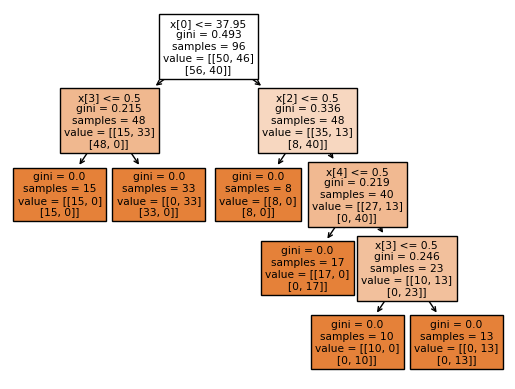

In [11]:
X_train, X_test, Y_train, Y_test = train_test_split(dataX, dataY, test_size=0.20)
best_alpha=0.0
best_classifier = DecisionTreeClassifier(random_state=50, ccp_alpha=best_alpha)
best_c = LabelPowerset(best_classifier)
best_classifier.fit(X_train, Y_train)
Y_train_pred = best_classifier.predict(X_train)
Y_test_pred = best_classifier.predict(X_test)

print(f"Train Accuracy = {accuracy_score(Y_train, Y_train_pred)}")
print(f"Test Accuracy = {accuracy_score(Y_test, Y_test_pred)}")
tree.plot_tree(best_classifier, filled=True)

In [12]:
tree_code_generator = DecisionTreeCodeGenerator(best_classifier, df.columns[0:6])
tree_code_generator.generate_code()

def tree(a1, a2, a3, a4, a5, a6):
  if a1 <= 37.95000076293945:
    if a4 <= 0.5:
      return [[15.  0.]
 [15.  0.]]
    else:  # if a4 > 0.5
      return [[ 0. 33.]
 [33.  0.]]
  else:  # if a1 > 37.95000076293945
    if a3 <= 0.5:
      return [[8. 0.]
 [8. 0.]]
    else:  # if a3 > 0.5
      if a5 <= 0.5:
        return [[17.  0.]
 [ 0. 17.]]
      else:  # if a5 > 0.5
        if a4 <= 0.5:
          return [[10.  0.]
 [ 0. 10.]]
        else:  # if a4 > 0.5
          return [[ 0. 13.]
 [ 0. 13.]]


In [13]:
def get_parameters_for_pruning():
    ans = []
    for i in range(10):
        ans.append(int((i + 1) * 10))
    return ans

def get_best_score_and_params():
    parameters = {'max_depth': get_parameters_for_pruning()}
    classifier = GridSearchCV(DecisionTreeClassifier(random_state=50), parameters)
    classifier.fit(dataX, dataY)
    accurate_model = classifier.best_estimator_
    return {
        'best_score': round(classifier.best_score_, 4), 
        'best_params': classifier.best_params_,
        'accurate_model': accurate_model
    }
best_score_and_params_with_accurate_model = get_best_score_and_params()
accurate_model = best_score_and_params_with_accurate_model['accurate_model']

def get_decision_rules_with_high_interpretability():
    features = ['temperature', 'nausea_occurence', 'lumbar_pain', 'urine_pushing', 'micturition_pains', 'burning_urethra']
    features_d1_d2 = ['inflammation_pred', 'nephritis_pred']
    dot_data = tree.export_graphviz(accurate_model, out_file=None, 
                                    feature_names=features,  
                                    class_names=features_d1_d2,
                                    filled=True)
    tree.plot_tree(accurate_model)
    return features

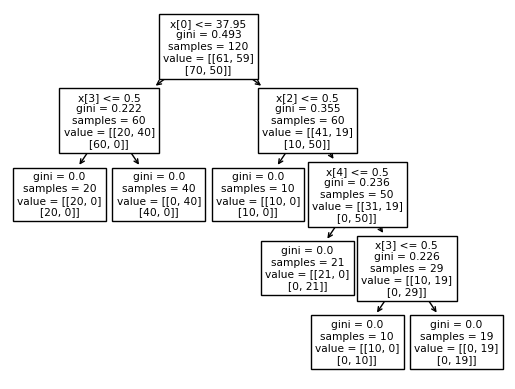

In [14]:
features = get_decision_rules_with_high_interpretability()

In [15]:
tree_code_generator = DecisionTreeCodeGenerator(accurate_model, features)
tree_code_generator.generate_code()

def tree(temperature, nausea_occurence, lumbar_pain, urine_pushing, micturition_pains, burning_urethra):
  if temperature <= 37.95000076293945:
    if urine_pushing <= 0.5:
      return [[20.  0.]
 [20.  0.]]
    else:  # if urine_pushing > 0.5
      return [[ 0. 40.]
 [40.  0.]]
  else:  # if temperature > 37.95000076293945
    if lumbar_pain <= 0.5:
      return [[10.  0.]
 [10.  0.]]
    else:  # if lumbar_pain > 0.5
      if micturition_pains <= 0.5:
        return [[21.  0.]
 [ 0. 21.]]
      else:  # if micturition_pains > 0.5
        if urine_pushing <= 0.5:
          return [[10.  0.]
 [ 0. 10.]]
        else:  # if urine_pushing > 0.5
          return [[ 0. 19.]
 [ 0. 19.]]


## 2. The LASSO and Boosting for Regression

### (a) Obtain Data

In [16]:
community_data = "../data/communities.data"
community_data_cols = "../data/communities.names"

In [17]:
class DataProcessor:
    def __init__(self, filename):
        self.filename = filename

    def get_columns_from_data(self):
        cols = []
        with open(self.filename, 'r') as file:
            for line in file:
                if "@attribute" in line:
                    column_name = line.split()[1]
                    cols.append(column_name)
        return cols

    @staticmethod
    def perform_train_test_split(df):
        train_df = df.iloc[:1495, :]
        test_df = df.iloc[1495:, :]
        return train_df, test_df

data_processor = DataProcessor(community_data_cols)


In [18]:
cols = data_processor.get_columns_from_data()
df = pd.read_csv(community_data, header=None, na_values='?')
df.columns = cols
df

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


In [19]:
train_df, test_df = DataProcessor.perform_train_test_split(df)

In [20]:
train_df

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1490,6,NaN,NaN,Hillsboroughtown,8,0.00,0.59,0.01,0.69,1.00,...,0.02,0.14,0.22,NaN,NaN,NaN,NaN,0.00,NaN,0.03
1491,6,NaN,NaN,Orangecity,8,0.16,0.62,0.03,0.74,0.48,...,0.07,0.40,0.14,0.07,0.05,0.85,0.5,0.61,0.19,0.20
1492,13,NaN,NaN,Waycrosscity,8,0.01,0.36,0.95,0.24,0.03,...,0.03,0.12,0.01,NaN,NaN,NaN,NaN,0.00,NaN,0.30
1493,39,85.0,49056.0,Mentorcity,8,0.06,0.53,0.01,0.98,0.05,...,0.08,0.15,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03


In [21]:
test_df

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
1495,6,NaN,NaN,MillValleycity,8,0.00,0.20,0.03,0.91,0.23,...,0.01,0.23,0.73,NaN,NaN,NaN,NaN,0.00,NaN,0.12
1496,48,NaN,NaN,LiveOakcity,8,0.00,0.55,0.13,0.78,0.15,...,0.01,0.18,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.11
1497,35,NaN,NaN,Portalescity,8,0.00,0.52,0.04,0.59,0.05,...,0.01,0.18,0.00,NaN,NaN,NaN,NaN,0.00,NaN,0.12
1498,42,17.0,25112.0,Fallstownship,8,0.04,0.51,0.07,0.92,0.09,...,0.06,0.13,0.16,NaN,NaN,NaN,NaN,0.00,NaN,0.06
1499,51,683.0,48952.0,Manassascity,8,0.03,0.59,0.20,0.75,0.19,...,0.03,0.23,0.06,NaN,NaN,NaN,NaN,0.00,NaN,0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


### (b) Missing values

In [22]:
df = df.iloc[:, 5:]
train_df = train_df.iloc[:, 5:]
test_df = test_df.iloc[:, 5:]

In [23]:
train_df

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1490,0.00,0.59,0.01,0.69,1.00,0.07,0.41,0.28,0.23,0.57,...,0.02,0.14,0.22,NaN,NaN,NaN,NaN,0.00,NaN,0.03
1491,0.16,0.62,0.03,0.74,0.48,0.42,0.44,0.57,0.40,0.25,...,0.07,0.40,0.14,0.07,0.05,0.85,0.5,0.61,0.19,0.20
1492,0.01,0.36,0.95,0.24,0.03,0.01,0.44,0.42,0.27,0.63,...,0.03,0.12,0.01,NaN,NaN,NaN,NaN,0.00,NaN,0.30
1493,0.06,0.53,0.01,0.98,0.05,0.01,0.40,0.40,0.24,0.29,...,0.08,0.15,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03


In [24]:
test_df

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
1495,0.00,0.20,0.03,0.91,0.23,0.05,0.15,0.19,0.09,0.42,...,0.01,0.23,0.73,NaN,NaN,NaN,NaN,0.00,NaN,0.12
1496,0.00,0.55,0.13,0.78,0.15,0.36,0.48,0.53,0.30,0.10,...,0.01,0.18,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.11
1497,0.00,0.52,0.04,0.59,0.05,0.62,0.84,0.78,0.75,0.43,...,0.01,0.18,0.00,NaN,NaN,NaN,NaN,0.00,NaN,0.12
1498,0.04,0.51,0.07,0.92,0.09,0.03,0.38,0.47,0.27,0.35,...,0.06,0.13,0.16,NaN,NaN,NaN,NaN,0.00,NaN,0.06
1499,0.03,0.59,0.20,0.75,0.19,0.10,0.38,0.62,0.35,0.11,...,0.03,0.23,0.06,NaN,NaN,NaN,NaN,0.00,NaN,0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,0.01,0.40,0.10,0.87,0.12,0.16,0.43,0.51,0.35,0.30,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,0.05,0.96,0.46,0.28,0.83,0.32,0.69,0.86,0.73,0.14,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,0.16,0.37,0.25,0.69,0.04,0.25,0.35,0.50,0.31,0.54,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,0.08,0.51,0.06,0.87,0.22,0.10,0.58,0.74,0.63,0.41,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


In [25]:
def get_cols_to_imputate(df):
    imputated_df = df.isna().mean().round(5).mul(100).sort_values(ascending=False)
    cols_to_imputate = imputated_df[imputated_df > 0].index
    return cols_to_imputate

In [26]:
cols_to_imputate = get_cols_to_imputate(df)
cols_to_imputate_df = pd.DataFrame(cols_to_imputate)
cols_to_imputate_df.columns = ['Columns to Imputate']
cols_to_imputate_df

,Columns to Imputate
0,PolicReqPerOffic
1,PctPolicMinor
2,LemasSwornFT
3,LemasSwFTPerPop
4,LemasSwFTFieldOps
5,LemasSwFTFieldPerPop
6,LemasTotalReq
7,LemasTotReqPerPop
8,PolicPerPop
9,RacialMatchCommPol


In [27]:
def impute(df):
    imputer = SimpleImputer(strategy='mean', missing_values=np.nan)
    for col in cols_to_imputate:
        imputer = imputer.fit(train_df[[col]])
        train_df[[col]] = imputer.transform(train_df[[col]])
        test_df[[col]] = imputer.transform(test_df[[col]])
    df_imputed=pd.concat([train_df,test_df])
    return df_imputed

In [28]:
df_imputed = impute(df)
df_imputed

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.060000,0.040000,0.900000,0.500000,0.32,0.140000,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,0.01,0.40,0.10,0.87,0.12,0.16,0.43,0.51,0.35,0.30,...,0.01,0.28,0.05,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.09
1990,0.05,0.96,0.46,0.28,0.83,0.32,0.69,0.86,0.73,0.14,...,0.02,0.37,0.20,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.45
1991,0.16,0.37,0.25,0.69,0.04,0.25,0.35,0.50,0.31,0.54,...,0.08,0.32,0.18,0.080000,0.060000,0.780000,0.000000,0.91,0.280000,0.23
1992,0.08,0.51,0.06,0.87,0.22,0.10,0.58,0.74,0.63,0.41,...,0.03,0.38,0.33,0.020000,0.020000,0.790000,0.000000,0.22,0.180000,0.19


### (c) Plot a correlation matrix

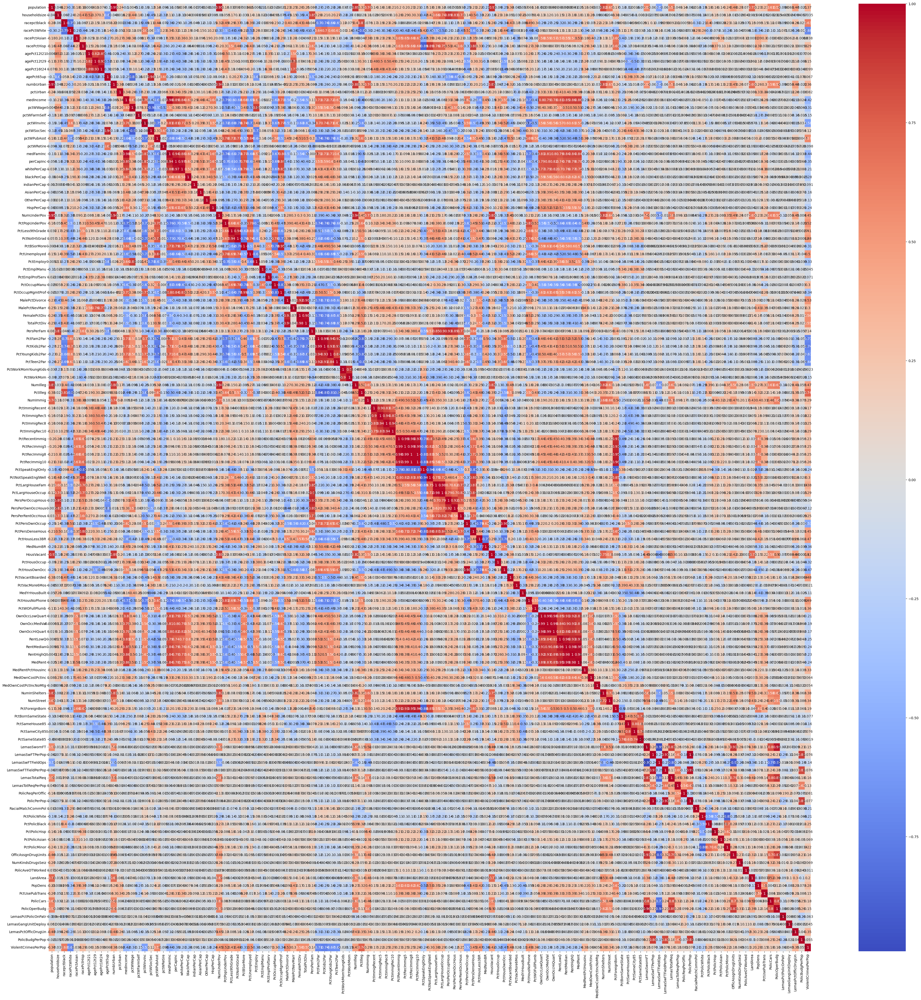

In [29]:
plt.figure(figsize=(50, 50))
corr = df_imputed.corr()
sns.heatmap(corr, cmap="coolwarm", annot=True)
plt.show()

### (d) Calculate the Coefficient of Variation CV

In [30]:
def calculate_cv(df):
    std = df.std()
    mean = df.mean()
    cv = std / mean
    describe = pd.DataFrame({'std': std, 'mean': mean, 'CV': cv})
    return describe

cv_features = calculate_cv(df_imputed)
cv_features

,std,mean,CV
population,0.126906,0.057593,2.203503
householdsize,0.163717,0.463395,0.353298
racepctblack,0.253442,0.179629,1.410920
racePctWhite,0.244039,0.753716,0.323782
racePctAsian,0.208877,0.153681,1.359162
...,...,...,...
LemasPctPolicOnPatr,0.085624,0.710740,0.120471
LemasGangUnitDeploy,0.162153,0.450052,0.360299
LemasPctOfficDrugUn,0.240328,0.094052,2.555266
PolicBudgPerPop,0.065815,0.191445,0.343782


### (e) Scatter plots and box plots for highest CV features

In [31]:
def get_top_features_with_highest_cv(df):
    print("##### Top Features with Highest CV #####")
    end = int(np.sqrt(128))
    top_cv_features = cv_features['CV'].nlargest(end)
    return top_cv_features

top_cv_features = get_top_features_with_highest_cv(df_imputed)
top_cv_features

##### Top Features with Highest CV #####


NumStreet              4.407702
NumInShelters          3.485481
NumIlleg               2.994196
NumImmig               2.900497
LemasPctOfficDrugUn    2.555266
NumUnderPov            2.304970
population             2.203503
numbUrban              2.001744
HousVacant             1.958780
LandArea               1.678031
racePctHisp            1.614278
Name: CV, dtype: float64

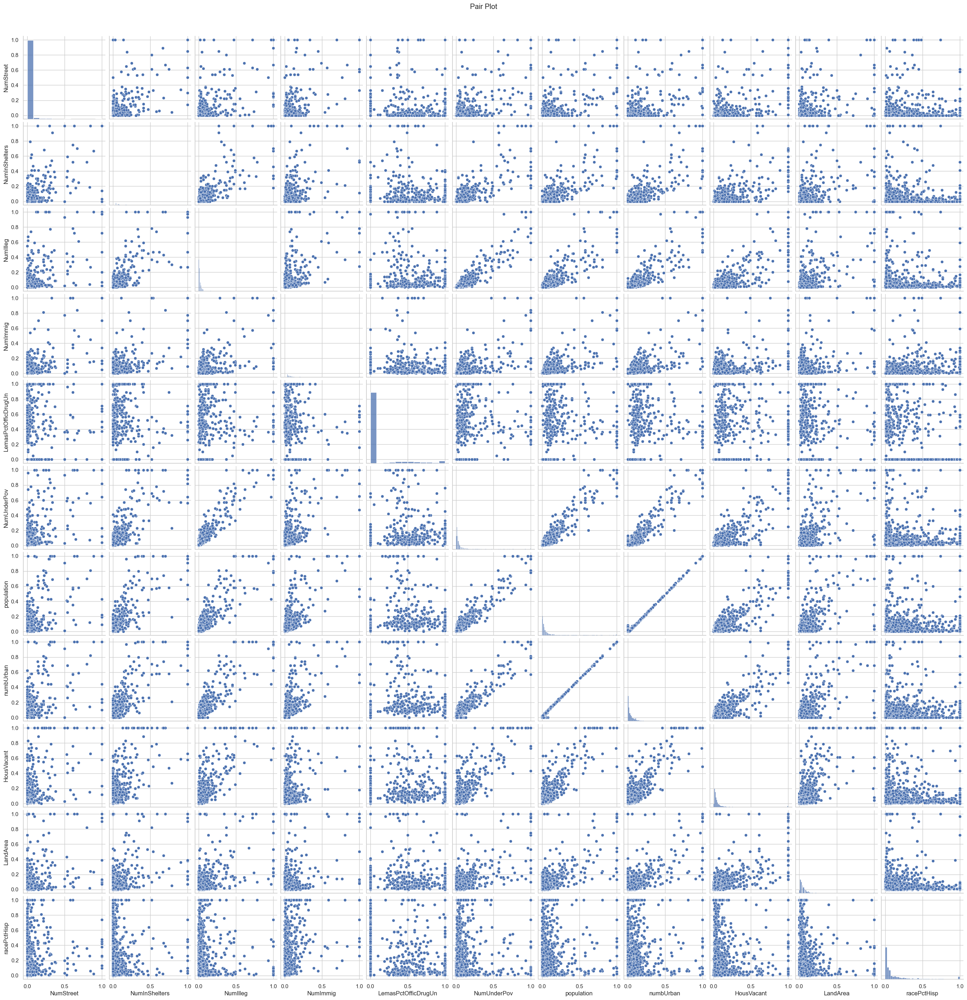

In [32]:
def get_pairplot(df, top_cv_features):
    sns.set(style="whitegrid")  
    pairplot = sns.pairplot(df[top_cv_features.index], palette="viridis")  
    pairplot.fig.suptitle("Pair Plot", y=1.02) 
    plt.show()

get_pairplot(df_imputed, top_cv_features)

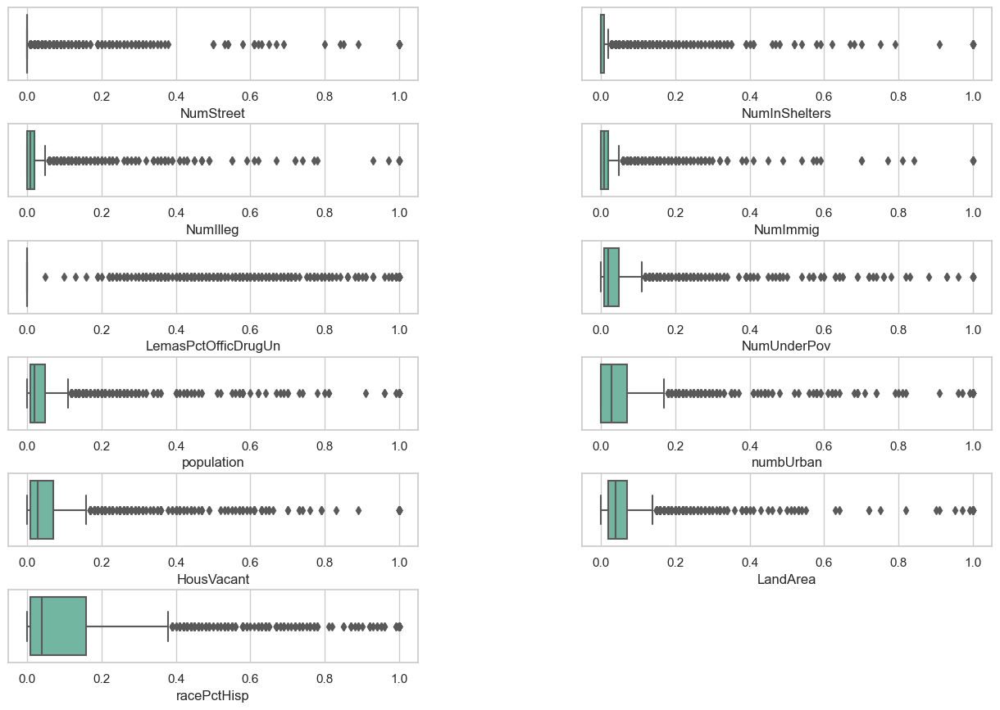

In [33]:
def plot_scatter_plots(df, top_cv_features):
    count = len(top_cv_features)
    plt.figure(figsize=(15, 10))
    for i, col in enumerate(top_cv_features.index):
        plt.subplot(6, 2, i + 1)
        sns.boxplot(x=col, data=df, palette="Set2")
    plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.6)
    plt.show()

plot_scatter_plots(df_imputed, top_cv_features)


Observations:

    The scatteplots are truely scattered and it seems that no conclusion can be drawn solely from the scatterplot alone. However, combining a scatterplot with a boxplot seems to provide some insight esp when the datapoints increas

### (f) Fit a linear model

In [34]:
def split_data_X_Y(df):
    X = df.iloc[:, :-1]
    Y = df.iloc[:, -1]
    return X, Y

train_X, train_Y = split_data_X_Y(train_df)
test_X, test_Y = split_data_X_Y(test_df)


In [35]:
def calculate_train_and_test_error(train_X, train_Y, test_X, test_Y):
    train_X = sm.add_constant(train_X)
    model = sm.OLS(train_Y, train_X).fit()
    train_Y_pred = model.predict(train_X)
    train_mse = mean_squared_error(train_Y, train_Y_pred)
    
    test_X = sm.add_constant(test_X)
    test_Y_pred = model.predict(test_X)
    test_mse = mean_squared_error(test_Y, test_Y_pred)
    
    display(model.summary())
    
    return round(train_mse, 4), round(test_mse, 4)

In [36]:
train_mse, test_mse = calculate_train_and_test_error(train_X, train_Y, test_X, test_Y)

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     ViolentCrimesPerPop   R-squared:                       0.711
Model:                             OLS   Adj. R-squared:                  0.686
Method:                  Least Squares   F-statistic:                     27.94
Date:                 Fri, 27 Oct 2023   Prob (F-statistic):          6.56e-291
Time:                         15:24:34   Log-Likelihood:                 955.40
No. Observations:                 1495   AIC:                            -1667.
Df Residuals:                     1373   BIC:                            -1019.
Df Model:                          121                                         
Covariance Type:             nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.4544      0.904      0.503      0.615      -1.319       2.228
population               -0.0199      0.477     -0.042      0.967      -0.955       0.916
householdsize            -0.0157      0.098     -0.161      0.872      -0.207       0.176
racepctblack              0.2848      0.060      4.754      0.000       0.167       0.402
racePctWhite              0.0106      0.067      0.159      0.874      -0.120       0.141
racePctAsian             -0.0278      0.041     -0.670      0.503      -0.109       0.054
racePctHisp               0.0180      0.065      0.275      0.784      -0.110       0.146
agePct12t21               0.1792      0.129      1.387      0.166      -0.074       0.433
agePct12t29              -0.3451      0.186     -1.858      0.063      -0.709       0.019
agePct16t24              -0.1237      0.198     -0.626      0.531      -0.511       0.264
agePct65up                0.0597      0.124      0.481      0.630      -0.184       0.303
numbUrban                -0.1260      0.465     -0.271      0.786      -1.038       0.786
pctUrban                  0.0484      0.019      2.581      0.010       0.012       0.085
medIncome                -0.1784      0.202     -0.881      0.378      -0.575       0.219
pctWWage                 -0.1399      0.107     -1.309      0.191      -0.350       0.070
pctWFarmSelf              0.0460      0.023      1.960      0.050   -3.35e-05       0.092
pctWInvInc               -0.2031      0.081     -2.505      0.012      -0.362      -0.044
pctWSocSec                0.1368      0.125      1.092      0.275      -0.109       0.383
pctWPubAsst               0.0601      0.054      1.109      0.268      -0.046       0.166
pctWRetire               -0.1249      0.045     -2.802      0.005      -0.212      -0.037
medFamInc                 0.3049      0.189      1.617      0.106      -0.065       0.675
perCapInc                -0.0485      0.222     -0.219      0.827      -0.484       0.387
whitePerCap              -0.1923      0.179     -1.072      0.284      -0.544       0.160
blackPerCap              -0.0401      0.030     -1.358      0.175      -0.098       0.018
indianPerCap             -0.0436      0.023     -1.911      0.056      -0.088       0.001
AsianPerCap               0.0301      0.022      1.381      0.168      -0.013       0.073
OtherPerCap               0.0304      0.022      1.364      0.173      -0.013       0.074
HispPerCap                0.0330      0.029      1.150      0.250      -0.023       0.089
NumUnderPov               0.0737      0.192      0.383      0.702      -0.303       0.451
PctPopUnderPov           -0.2035      0.074     -2.736      0.006      -0.349      -0.058
PctLess9thGrade          -0.0584      0.079     -0.743      0.457      -0.213       0.096
PctNotHSGrad

In [37]:
mse_data = {
    "Train Mean Squared Error": [train_mse],
    "Test Mean Squared Error": [test_mse]
}

mse_df = pd.DataFrame(mse_data)
print(mse_data)
mse_df

{'Train Mean Squared Error': [0.0163], 'Test Mean Squared Error': [0.0181]}


,Train Mean Squared Error,Test Mean Squared Error
0,0.0163,0.0181


### (g) Fit a ridge regression model

In [38]:
def generate_alphas():
    alphas = [10 ** i for i in range(-10, 11)]
    return alphas

alphas = generate_alphas()

ridge_cv = RidgeCV(
    alphas=alphas,
    cv=KFold(n_splits=5, random_state=1, shuffle=True),
    scoring='neg_mean_squared_error'
)

ridge_cv.fit(train_X, train_Y)
chosen_alpha = ridge_cv.alpha_
print("Model info:", ridge_cv)
predicted_Y = ridge_cv.predict(test_X)

test_mse = mean_squared_error(test_Y, predicted_Y)
test_r2 = r2_score(test_Y, predicted_Y)

statistics = {
    "Chosen Alpha": [chosen_alpha],
    "Test MSE": [test_mse],
    "Test R2": [test_r2]
}

statistics_df = pd.DataFrame(statistics)
statistics_df.T


Model info: RidgeCV(alphas=[1e-10, 1e-09, 1e-08, 1e-07, 1e-06, 1e-05, 0.0001, 0.001, 0.01,
                0.1, 1, 10, 100, 1000, 10000, 100000, 1000000, 10000000,
                100000000, 1000000000, 10000000000],
        cv=KFold(n_splits=5, random_state=1, shuffle=True),
        scoring='neg_mean_squared_error')


,0
Chosen Alpha,1.000000
Test MSE,0.017732
Test R2,0.627119


### (h) Fit a LASSO model

In [39]:
def calculate_statistics(train_X, train_Y, test_X, test_Y, is_standardized=False):
    alpha_values = generate_alphas()
    lasso = LassoCV(alphas=alpha_values,
                    cv=KFold(n_splits=5, random_state=50, shuffle=True),
                    max_iter=10000)
    
    if is_standardized:
        scaler = StandardScaler()
        train_X = scaler.fit_transform(train_X)
        test_X = scaler.transform(test_X)
        
    lasso.fit(train_X, train_Y)
    predicted_Y = lasso.predict(test_X)

    chosen_alpha = lasso.alpha_
    test_mse = mean_squared_error(test_Y, predicted_Y)
    test_r2 = r2_score(test_Y, predicted_Y)

    statistics = {
        "Chosen Alpha": [chosen_alpha],
        "Test MSE": [test_mse],
        "Test R2": [test_r2]
    }

    stats_df = pd.DataFrame(statistics)
    return stats_df.T, lasso

In [40]:
lasso_normalized_df, lr = calculate_statistics(train_X, train_Y, test_X, test_Y)
lasso_normalized_df

,0
Chosen Alpha,0.000100
Test MSE,0.017786
Test R2,0.625991


In [41]:
def get_selected_features(model, feature_names):
    selected_features = {}
    for feature, coef in zip(feature_names, model.coef_):
        if coef != 0:
            selected_features[feature] = round(coef, 4)
    
    print('Number of selected features:', len(selected_features))
    pprint.pprint(selected_features)

get_selected_features(lr, train_X.columns)

Number of selected features: 78
{'AsianPerCap': 0.0292,
 'FemalePctDiv': -0.0956,
 'HispPerCap': 0.0257,
 'HousVacant': 0.1303,
 'LandArea': 0.0411,
 'LemasGangUnitDeploy': 0.0407,
 'LemasPctOfficDrugUn': 0.0006,
 'LemasPctPolicOnPatr': 0.0217,
 'LemasSwFTFieldPerPop': 0.0836,
 'LemasTotalReq': -0.0395,
 'MalePctDivorce': 0.1326,
 'MalePctNevMarr': 0.1507,
 'MedNumBR': 0.006,
 'MedOwnCostPctInc': -0.018,
 'MedOwnCostPctIncNoMtg': -0.0796,
 'MedRent': 0.1734,
 'MedRentPctHousInc': 0.0906,
 'MedYrHousBuilt': -0.0162,
 'NumIlleg': -0.0623,
 'NumImmig': -0.0812,
 'NumInShelters': 0.0633,
 'NumKindsDrugsSeiz': -0.0324,
 'NumStreet': 0.1696,
 'OfficAssgnDrugUnits': -0.0075,
 'OtherPerCap': 0.0236,
 'OwnOccLowQuart': -0.0189,
 'PctBSorMore': 0.0173,
 'PctEmplManu': -0.0192,
 'PctEmploy': 0.155,
 'PctForeignBorn': 0.054,
 'PctHousLess3BR': 0.0649,
 'PctHousNoPhone': 0.0268,
 'PctHousOccup': -0.0595,
 'PctIlleg': 0.0956,
 'PctImmigRec10': -0.0056,
 'PctKids2Par': -0.1981,
 'PctLargHouseOccup': 

In [42]:
lasso_standardized_df, lr = calculate_statistics(train_X, train_Y, test_X, test_Y, is_standardized=True)
lasso_standardized_df

,0
Chosen Alpha,0.001000
Test MSE,0.017758
Test R2,0.626579


In [43]:
get_selected_features(lr, train_X.columns)

Number of selected features: 68
{'AsianPerCap': 0.0049,
 'FemalePctDiv': -0.0024,
 'HispPerCap': 0.0031,
 'HousVacant': 0.016,
 'LandArea': 0.0041,
 'LemasGangUnitDeploy': 0.0062,
 'LemasPctPolicOnPatr': 0.0021,
 'LemasSwFTFieldPerPop': 0.0075,
 'LemasTotalReq': -0.006,
 'MalePctDivorce': 0.0151,
 'MalePctNevMarr': 0.0151,
 'MedOwnCostPctInc': -0.0003,
 'MedOwnCostPctIncNoMtg': -0.0135,
 'MedRent': 0.0191,
 'MedRentPctHousInc': 0.0147,
 'MedYrHousBuilt': -0.0021,
 'NumIlleg': -0.0016,
 'NumImmig': -0.0064,
 'NumInShelters': 0.0057,
 'NumKindsDrugsSeiz': -0.0026,
 'NumStreet': 0.0179,
 'OfficAssgnDrugUnits': -0.0033,
 'OtherPerCap': 0.0034,
 'PctEmplManu': -0.0002,
 'PctEmploy': 0.0143,
 'PctForeignBorn': 0.0042,
 'PctHousLess3BR': 0.0087,
 'PctHousOccup': -0.0117,
 'PctIlleg': 0.0255,
 'PctImmigRec5': -0.0006,
 'PctKids2Par': -0.0396,
 'PctLargHouseOccup': -0.0,
 'PctLess9thGrade': -0.0002,
 'PctNotSpeakEnglWell': -0.0032,
 'PctPersDenseHous': 0.0333,
 'PctPersOwnOccup': -0.0065,
 'Pct

The difference in test mean squared error (test_mse) between the model trained with standardized data and the one trained with non-standardized data is minimal. Surprisingly, it seems that the model trained with non-standardized data has a slightly lower test mse compared to the model trained with standardized data.

### (i) Fit a PCR model

In [44]:
def principal_component_regression(train_data, train_target, dimension):
    mse_scores = []
    num_folds = 5
    num_jobs = -1
    pca = PCA(n_components=dimension)
    lr = LinearRegression(fit_intercept=True)
    pipeline = make_pipeline(pca, lr)
    mse_scores = cross_val_score(pipeline,
                                  train_data,
                                  train_target,
                                  cv=num_folds,
                                  n_jobs=num_jobs,
                                  scoring="neg_mean_squared_error")
    return sum(abs(mse_scores)) / len(mse_scores)

pcr_results = {}
num_columns = len(train_X.columns)
for i in range(1, num_columns + 1):
    pcr_results[i] = principal_component_regression(train_X, train_Y, i)

pprint.pprint(pcr_results)
min_mse = float('inf')
best_dimension = None
for dimension, mse in pcr_results.items():
    if mse < min_mse:
        best_dimension = dimension
        min_mse = mse

pcr_summary = {
    "Selected Dimension": [best_dimension],
    "Minimum Validation Error": [min_mse]
}

pcr_dataframe = pd.DataFrame(pcr_summary)
pcr_dataframe

{1: 0.0379009536484687,
 2: 0.03062925126866569,
 3: 0.02756668562423124,
 4: 0.024294378807158915,
 5: 0.02309290848165765,
 6: 0.022648486053300786,
 7: 0.020143622270675593,
 8: 0.020116100997978614,
 9: 0.020036696071624147,
 10: 0.01997221464370732,
 11: 0.020010641265556163,
 12: 0.02005186191286073,
 13: 0.0199342552166857,
 14: 0.019971808842999986,
 15: 0.019996680008103694,
 16: 0.020008786098313844,
 17: 0.02002979172778601,
 18: 0.02012406468062434,
 19: 0.02018933810168532,
 20: 0.02026368110324357,
 21: 0.02029287103172278,
 22: 0.020245310214178865,
 23: 0.020063708691261745,
 24: 0.020025262334173982,
 25: 0.02004232291092319,
 26: 0.020089749637170067,
 27: 0.020066560236286158,
 28: 0.020047056272355958,
 29: 0.019941855073498615,
 30: 0.019902558782173778,
 31: 0.019891057273211277,
 32: 0.01993467185894291,
 33: 0.019984579916723037,
 34: 0.019937977371520192,
 35: 0.019969713830408492,
 36: 0.019995596999115055,
 37: 0.019966646456873013,
 38: 0.019877431778134537,

,Selected Dimension,Minimum Validation Error
0,96,0.019409


In [45]:
def calculate_pca_test_error():    
    selected_dimension = pcr_summary['Selected Dimension'][0]
    pca = PCA(n_components=selected_dimension).fit(train_X)
    pca_train_data = pca.transform(train_X)
    pca_test_data = pca.transform(test_X)
    lr_model = LinearRegression().fit(pca_train_data, train_Y)
    predicted_test_Y = lr_model.predict(pca_test_data)
    pca_test_mse = mean_squared_error(test_Y, predicted_test_Y)
    return round(pca_test_mse, 4)


In [46]:
print("PCA Test MSE: ", calculate_pca_test_error())

PCA Test MSE:  0.0185


### (j) Fit a boosting tree

In [47]:
xgb_results = {}
for alpha in generate_alphas():
    xgb_model = xgb.XGBRegressor(objective='reg:squarederror',
                                reg_alpha=alpha,
                                random_state=50)
    mse_scores = cross_val_score(xgb_model,
                                train_X,
                                train_Y,
                                cv=KFold(5, shuffle=True, random_state=50),
                                n_jobs=-1,
                                scoring="neg_mean_squared_error")
    average_mse = sum(abs(mse_scores)) / len(mse_scores)
    xgb_results[alpha] = f'{round(average_mse, 4)}'

pprint.pprint(xgb_results)

min_mse = float('inf')
best_alpha = None
for alpha, mse in xgb_results.items():
    if float(mse) < min_mse:
        min_mse = float(mse)
        best_alpha = alpha

xgb_summary = {
    "Selected Alpha": [best_alpha],
    "Minimum Validation Error MSE": [min_mse]
}

xgb_dataframe = pd.DataFrame(xgb_summary)
xgb_dataframe



{1e-10: '0.0234',
 1e-09: '0.0234',
 1e-08: '0.0234',
 1e-07: '0.0234',
 1e-06: '0.0233',
 1e-05: '0.0234',
 0.0001: '0.0236',
 0.001: '0.0227',
 0.01: '0.022',
 0.1: '0.0219',
 1: '0.021',
 10: '0.0225',
 100: '0.0565',
 1000: '0.0565',
 10000: '0.0565',
 100000: '0.0565',
 1000000: '0.0565',
 10000000: '0.0565',
 100000000: '0.0565',
 1000000000: '0.0565',
 10000000000: '0.0565'}


,Selected Alpha,Minimum Validation Error MSE
0,1,0.021


In [48]:
def calculate_xgb_test_error():
    xgb_model = xgb.XGBRegressor(objective='reg:squarederror',
                                 reg_alpha=xgb_summary['Selected Alpha'][0],
                                 random_state=50)
    xgb_model.fit(train_X, train_Y)
    predicted_test_xgb = xgb_model.predict(test_X)
    test_mse = mean_squared_error(test_Y, predicted_test_xgb)
    return test_mse

In [49]:
print("XGBoost Test MSE: ", round(calculate_xgb_test_error(), 4))


XGBoost Test MSE:  0.0177
